# Apartments.com - Gentrification Code Words  



In [83]:
import pandas as pd
import geopandas as gpd

In [84]:
import requests
from bs4 import BeautifulSoup

In [85]:
import time
import random

In [86]:
import re

In [87]:
import matplotlib.pyplot as plt
import contextily as ctx

In [88]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
nltk.download('stopwords')
nltk.download('punkt')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\audre\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\audre\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

## read_file() - First 500 Neighborhood Listings 

Unfortunately, when I saved the csvs of scraped neighborhoods, Koreatown and Highland Park ...

In [89]:
# saving the gdfs of 500 scraped posts for each neighborhood to csvs so I don't have to scrape again: 
eho_500 = pd.read_csv('C:/Users/audre/OneDrive/Documents/229-GitHub/Final229_csvs/eho_500_gdf.csv')
bohe_500 = pd.read_csv('C:/Users/audre/OneDrive/Documents/229-GitHub/Final229_csvs/bohe_500_gdf.csv')
ktown_500 = pd.read_csv('C:/Users/audre/OneDrive/Documents/229-GitHub/Final229_csvs/ktown_500_gdf.csv')
hipa_500 = pd.read_csv('C:/Users/audre/OneDrive/Documents/229-GitHub/Final229_csvs/hipa_500_gdf.csv')


In [90]:
eho_500 = gpd.GeoDataFrame(eho_500, geometry=gpd.points_from_xy(eho_500.Longitude, eho_500.Latitude))
bohe_500 = gpd.GeoDataFrame(bohe_500, geometry=gpd.points_from_xy(bohe_500.Longitude, bohe_500.Latitude))
ktown_500 = gpd.GeoDataFrame(ktown_500, geometry=gpd.points_from_xy(ktown_500.Longitude, ktown_500.Latitude))
hipa_500 = gpd.GeoDataFrame(hipa_500, geometry=gpd.points_from_xy(hipa_500.Longitude, hipa_500.Latitude))


<AxesSubplot:>

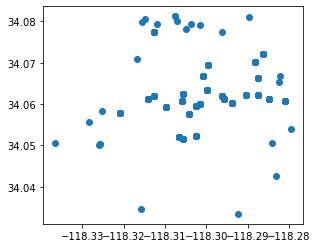

In [70]:
ktown_500.plot()

## Mapping listings

In [91]:
eho_500=eho_500.set_crs("EPSG:4326")
bohe_500=bohe_500.set_crs("EPSG:4326")
ktown_500=ktown_500.set_crs("EPSG:4326")
hipa_500=hipa_500.set_crs("EPSG:4326")

### Neighborhood boundaries

In [92]:
r_api = requests.get('https://opendata.arcgis.com/datasets/d6c55385a0e749519f238b77135eafac_0.geojson')
import json 
d_api = json.loads(r_api.text)

In [93]:
gdf_api = gpd.GeoDataFrame.from_features(d_api['features'])
gdf_api.crs = "EPSG:4326"
# loading json into a geodataframe 
## SOURCE: https://stackoverflow.com/questions/45552955/loading-json-into-a-geodataframe

In [94]:
easthollywood = gdf_api[gdf_api['name'] == 'East Hollywood']
boyleheights = gdf_api[gdf_api['name'] == 'Boyle Heights']
koreatown = gdf_api[gdf_api['name'] == 'Koreatown']
highlandpark = gdf_api[gdf_api['name'] == 'Highland Park']

In [95]:
easthollywood = easthollywood.set_crs("EPSG:4326")
boyleheights = boyleheights.set_crs("EPSG:4326")
koreatown = koreatown.set_crs("EPSG:4326")
highlandpark = highlandpark.set_crs("EPSG:4326")

Let's make sure all the neighborhoods map properly. 

#### East Hollywood

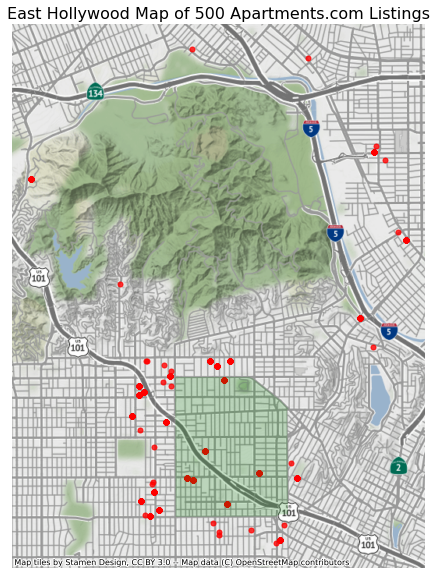

In [25]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(10, 10))

# add the layer with ax=ax in the argument 
eho_500.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "red")

# add neighborhood polygon layer 
easthollywood.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('East Hollywood Map of 500 Apartments.com Listings',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

The listings that are marketed as East Hollywood extend north of Griffith Park and the other side of the 5 Freeway. 

**Boyle Heights**

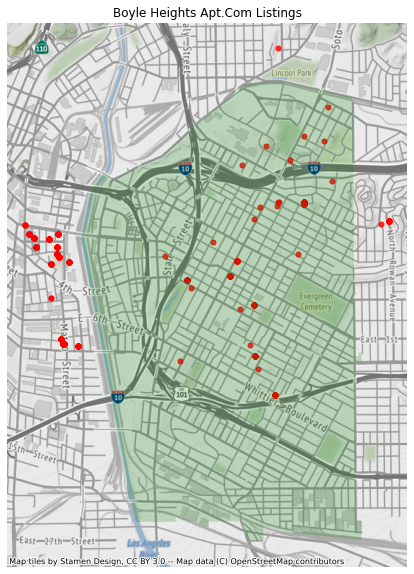

In [26]:
fig, ax = plt.subplots(figsize=(10, 10))
 
# add listings layer 
bohe_500.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "red")

# add neighborhood polygon layer 
boyleheights.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

ax.axis("off")
ax.set_title("Boyle Heights Apt.Com Listings")

# add a basemap
ctx.add_basemap(ax)

Listings that are marked as Boyle Heights 

**Koreatown**

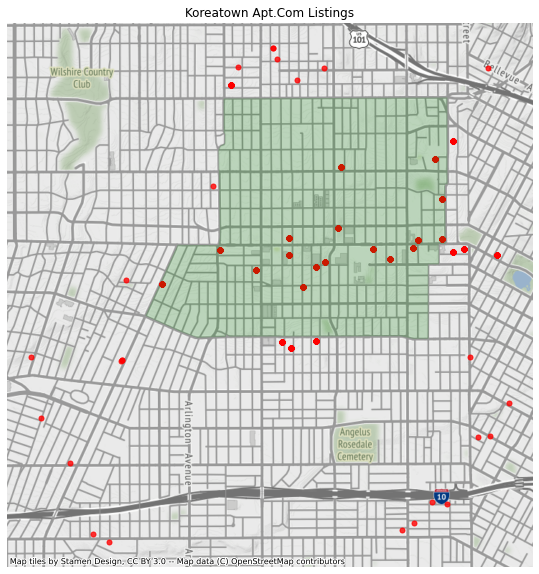

In [27]:
fig, ax = plt.subplots(figsize=(10, 10))
 
# add listings layer 
ktown_500.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "red")

# add neighborhood polygon layer 
koreatown.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

ax.axis("off")
ax.set_title("Koreatown Apt.Com Listings")

# add a basemap
ctx.add_basemap(ax)

**Highland Park**

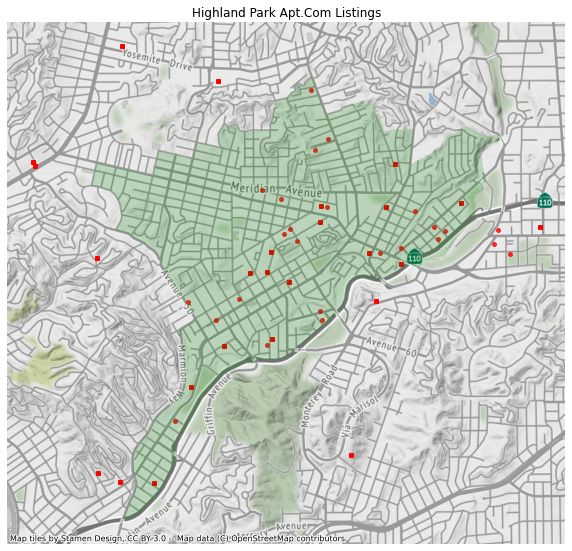

In [28]:
fig, ax = plt.subplots(figsize=(10, 10))
 
# add listings layer 
hipa_500.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=15, color = "red")

# add neighborhood polygon layer 
highlandpark.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

ax.axis("off")
ax.set_title("Highland Park Apt.Com Listings")

# add a basemap
ctx.add_basemap(ax)

Okay now I'll get into the gentrification word counts.

## Gentrification Word Counts   

### Define function that returns wordlist 
Creates long string, removing tags, lines, white spaces, tabs, punctuation with regex library

In [76]:
# edited the stringify_np function to turn a dataframe of posts into a long string with no punctuations, then splits into wordlists 

def return_wordlist(postdf, column):
    
    series = postdf[column].apply(str)
    list_ = series.tolist()
    string = str(list_)
    
    #remove tags 
    notags = re.sub(r"<[^>]*>", "", string)

    #remove new lines 
    nnline = re.sub(r"\\n", " ", notags)
    
    #remove white spaces and tabs (\t)
    words = re.sub(r"\s+", " ", nnline)
    
    #remove punctuation 
    words_np = re.sub(r"[^A-z\s]", "", words)
    
    # wordlistify 
    wordlist = words_np.split()
    
    return wordlist
    

In [17]:
# split the string of descriptions of each neighborhood's first 500 apt.com posts into a list of single words  
wl500_eho = return_wordlist(eho_500, "Description")
wl500_bohe = return_wordlist(bohe_500, "Description")
wl500_ktown = return_wordlist(ktown_500, "Description")
wl500_hipa = return_wordlist(hipa_500, "Description")

In [18]:
##unique amenities
wlua_eho = return_wordlist(eho_500, "Unique Amenities")
wlua_bohe =return_wordlist(bohe_500, "Unique Amenities")
wlua_ktown = return_wordlist(ktown_500, "Unique Amenities")
wlua_hipa = return_wordlist(hipa_500, "Unique Amenities")

##apartment features
wlaf_eho = return_wordlist((eho_500), "Apartment Features")
wlaf_bohe = return_wordlist((bohe_500), "Apartment Features")
wlaf_ktown = return_wordlist((ktown_500), "Apartment Features")
wlaf_hipa = return_wordlist((hipa_500), "Apartment Features")


##community amenities 
wlca_eho = return_wordlist((eho_500), "Community Amenities")
wlca_bohe = return_wordlist((bohe_500), "Community Amenities")
wlca_ktown = return_wordlist((ktown_500), "Community Amenities")
wlca_hipa = return_wordlist((hipa_500), "Community Amenities")

### Word Count on Descriptions

In [77]:
def countWords_nostop(wordlist): 
    # original code: swords = [re.sub(r"[^A-z\s]", "", sword) for sword in stopwords.words('english')]
    swords = stopwords.words('english')
    swords.extend(('br', 'div', 'la', 'los', 'angeles', 'apartments', 'housing', 'apartment', 'month', 'lease', 'one', 'bedroom', 'homes', 'select', 'including', 'available', 'deposit','st','ca', 'amp', 'e', 'located', 'nd', 'ave'))
    ###add more stopwords to remove here^ 
    
    counts = {} # a dictionary to hold the counts
    for word in wordlist:
        # make lower case 
        lword = word.lower()
        
        # skip the stop words
        if lword in swords:
            continue
        
        # add to list of counts  
        elif lword in counts:
            counts[lword] +=1
        else:
            # doesn't exist in the dictionary
            counts[lword] = 1

    # convert the dictionary to a dataframe SOURCE: https://stackoverflow.com/questions/18837262/convert-python-dict-into-a-dataframe
    df = pd.DataFrame.from_dict(counts, orient='index', columns=['word_count'])

    # sort it by the word_count column
    df.sort_values('word_count', ascending=False, inplace=True)
    df.index.name = 'word'

    return df


In [70]:
eho_freq = pd.DataFrame()
eho_freq = countWords_nostop(wl500_eho)

bohe_freq = pd.DataFrame()
bohe_freq = countWords_nostop(wl500_bohe)

ktown_freq = pd.DataFrame()
ktown_freq = countWords_nostop(wl500_ktown)

hipa_freq = pd.DataFrame()
hipa_freq = countWords_nostop(wl500_hipa)

### Gentrification Code Word Selection

I added the following words as gentrification code words: 
* Amenities offered onsite ('private', 'security', 'lounge', luxury', 'gated', 'modern', 'prime')
* Neighborhood characteristics ('central', 'downtown', 'walking', 'accessible', 'charming', 'quirky', 'unique', 'quaint', 'coming', 'authentic', 'restaurants', 'culture', 'cultural', 'foodies', 'diverse', 'character', 'vibe', 'hip', 'dense', 'cool,' 'funky', 'landmark', 'historic')
* Yuppie characteristics ('vegan', 'gluten', 'art', 'bars', 'beer', 'stadium', 'preserved', 'outdoors')
* Who is the target audience? ('affordable', 'upscale', 'leisure', 'budget') 


Apartments.com has neighborhood descriptions, so I picked some interesting words to include in our gentrification code word list.

East Hollwood
* Although smaller than its better-known neighbor to the west, East Hollywood is a **central**ly located neighborhood in Los Angeles. East Hollywood is **accessible** to various freeways and many other popular neighborhoods, so commuters are set. This neighborhood boasts **lower rent costs** than its neighbors, a **diverse** community, and **unique** restaurants. Los Angeles City College, Barnsdall Art Park, and three large hospitals are all located in the East Hollywood area. This community sits just two miles from **Downtown** Los Angeles, making it popular for those interested in staying close to the city. With a **dense** population and a **hip vibe**, East Hollywood is the place to be.

Boyle Heights
* Southeast Los Angeles is directly south of the Fashion District and east of the University of Southern California (USC). This large neighborhood is minutes from downtown Los Angeles, Hollywood, and Beverly Hills. Downtown LA lies just on the other side of the 110 Freeway, a mere two miles away. This **densely-populated**, **diverse** neighborhood features everything LA, from **food** trucks and corner markets to wide sidewalks and residential areas filled with bungalows, ranch, and Spanish Colonial **architecture**. Southeast LA features palm trees and mountain views, tampered with gritty undertones to give it a **cool, funky vibe**. In this neighborhood, tattoo parlors sit next to Asian markets, and in the alleyway a colorful mural adorns the side of the building. One area **landmark**, the **historic** Los Angeles Memorial Coliseum, sits on the other side of the 110 Freeway and played host to the 1932 and 1984 summer Olympics. Currently home to the USC Trojans, the **stadium** has also counted the Los Angeles Raiders and Dodgers as residents at one time or the other in their storied histories.

Koreatown
* As the name suggests, the atmosphere in Koreatown is heavily influenced by Korean **culture**, and it is a favorite **destination** among **foodies** city-wide for its endless selection of **authentic** Korean restaurants. But the community has a much more **diverse** character than that: The broad range of **cultural** influences is exemplified in **landmarks** like the synagogue/contemporary **art gallery** of the Wilshire Boulevard Temple, the Latin fusion cuisine of Roy Choi’s **restaurants**, and the popular German/Korean/Hawaiian tinged gastropub, Biergarten. As one of the most popular sections of LA during Hollywood’s golden age, many **historic** buildings, **bars**, and **restaurants** have been **preserved** or **restored** to transport patrons to another time—in fact, the interiors of several local eateries were used as locations for the 1960s-set TV series, “Mad Men.”

Highland Park
* A large sector of the city, Northeast Los Angeles encompasses neighborhoods like Echo Park and Highland Park. This expansive LA area offers rentals for every type of renter and every **budget**. Abundant apartments, houses, condos, and townhomes can be found in Northeast Los Angeles, ranging from **affordable** to **upscale**. Residents of this area can enjoy the great **outdoors** at locales like Ernest E. Debs Regional **Park**, Hermon Park, Rio De Los Angeles State Park, and Elysian Park. Although Northeast LA offers an **escape** from big-city living, residents can easily travel into **downtown** for work or **leisure**. **Amenities** and **attractions** like Dodger Stadium, Los Angeles State Historic Park, and Chinatown are all within reach of this sprawling district.





### Gentrification Keyword Counts 

In [16]:
g_codes = ['private', 'amenities','lounge', 'luxury','luxurious','gated','unique','modern','prime','bars','restaurants', 'safe','walk','walking','walkable', 'security', 'vegan','gluten', 'private', 'security', 'lounge', 'luxury', 'gated', 'modern', 'prime', 'central', 'downtown', 'walking', 'accessible', 'charming', 'quirky', 'unique', 'quaint', 'coming', 'authentic', 'restaurants', 'culture', 'cultural', 'foodies', 'diverse', 'character', 'vibe', 'hip', 'dense', 'cool,' 'funky', 'landmark', 'historic', 'vegan', 'gluten', 'art', 'bars', 'beer', 'stadium', 'preserved', 'outdoors', 'affordable', 'upscale', 'leisure', 'budget', 'vegan', 'gluten', 'art', 'bars', 'beer', 'stadium', 'preserved', 'outdoors']

In [71]:
print("Frequency of Selected Keywords in East Hollywood")
eho_freq = eho_freq.reset_index()
eho_g = eho_freq[eho_freq['word'].isin(g_codes)]
eho_g['count_per_10posts'] = eho_g['word_count']/len(eho_500)*10 #normalize by number of posts scraped 
eho_g.head()

Frequency of Selected Keywords in East Hollywood


<ipython-input-71-3b40e4823607>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eho_g['count_per_10posts'] = eho_g['word_count']/len(eho_500)*10 #normalize by number of posts scraped


,word,word_count,count_per_10posts
5,private,514,10.28
12,unique,362,7.24
29,lounge,266,5.32
38,modern,233,4.66
39,amenities,228,4.56


In [72]:
print("Frequency of Selected Keywords in Boyle Heights")
bohe_freq = bohe_freq.reset_index()
bohe_g = bohe_freq[bohe_freq['word'].isin(g_codes)]
bohe_g['count_per_10posts'] = bohe_g['word_count']/len(bohe_500)*10 #normalize by number of posts scraped 
bohe_g.head(5)

Frequency of Selected Keywords in Boyle Heights


<ipython-input-72-e4e15e1927c4>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bohe_g['count_per_10posts'] = bohe_g['word_count']/len(bohe_500)*10 #normalize by number of posts scraped


,word,word_count,count_per_10posts
4,downtown,367,7.384306
10,private,289,5.814889
12,unique,285,5.734406
21,restaurants,207,4.164990
34,amenities,154,3.098592


In [73]:
print("Frequency of Selected Keywords in Koreatown")
ktown_freq = ktown_freq.reset_index()
ktown_g = ktown_freq[ktown_freq['word'].isin(g_codes)]
ktown_g['count_per_10posts'] = ktown_g['word_count']/len(ktown_500)*10 #normalize by number of posts scraped 
ktown_g.head()

Frequency of Selected Keywords in Koreatown


<ipython-input-73-8e5c089bf270>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ktown_g['count_per_10posts'] = ktown_g['word_count']/len(ktown_500)*10 #normalize by number of posts scraped


,word,word_count,count_per_10posts
1,unique,532,10.64
9,lounge,418,8.36
18,private,366,7.32
27,amenities,305,6.10
30,modern,274,5.48


In [74]:
print("Frequency of Selected Keywords in Highland Park")
hipa_freq = hipa_freq.reset_index()
hipa_g = hipa_freq[hipa_freq['word'].isin(g_codes)]
hipa_g['count_per_10posts'] = hipa_g['word_count']/len(hipa_500)*10 #normalize by number of posts scraped 
hipa_g.head()

Frequency of Selected Keywords in Highland Park


<ipython-input-74-15943ce673d6>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hipa_g['count_per_10posts'] = hipa_g['word_count']/len(hipa_500)*10 #normalize by number of posts scraped


,word,word_count,count_per_10posts
11,unique,267,5.34
21,central,190,3.80
29,downtown,171,3.42
30,gated,171,3.42
61,private,114,2.28


*Top gentrification code word for each neighborhood*

East Hollywood: "private"

Boyle Heights: "downtown" 

Koreatown & Highland Park: "unique"

"unique" and "private make the top three gentrification codewords of all four neighborhoods. 

Now I'll graph the code word frequencies: 

### Gentrification Code Word Bar Graphs

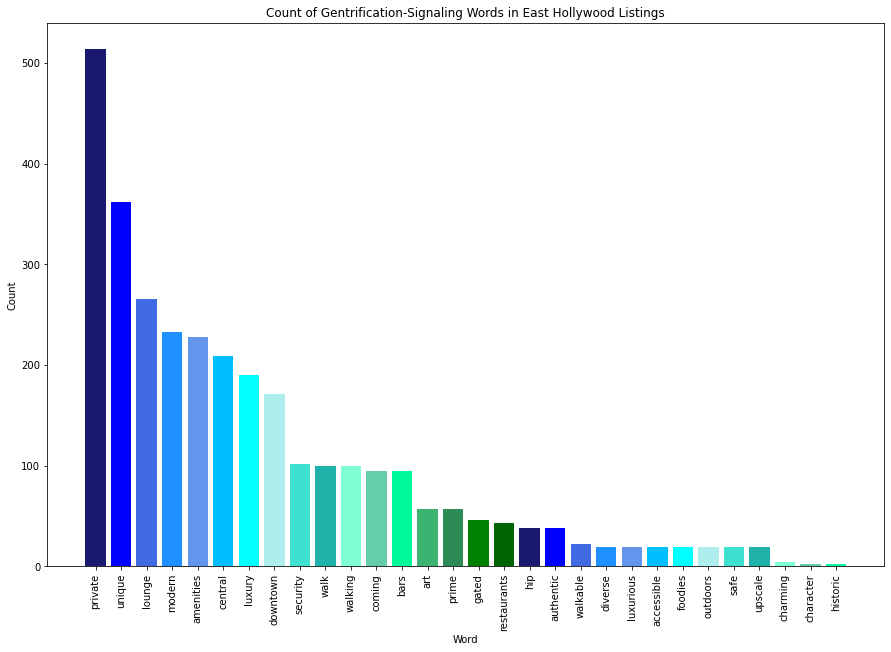

In [62]:
# East Hollwood - gentrification code words
plt.figure(figsize=(15,10))
plt.bar(eho_g['word'], eho_g['word_count'], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")

plt.xticks(rotation=90) 


plt.title("Count of Gentrification-Signaling Words in East Hollywood Listings")
plt.show() 



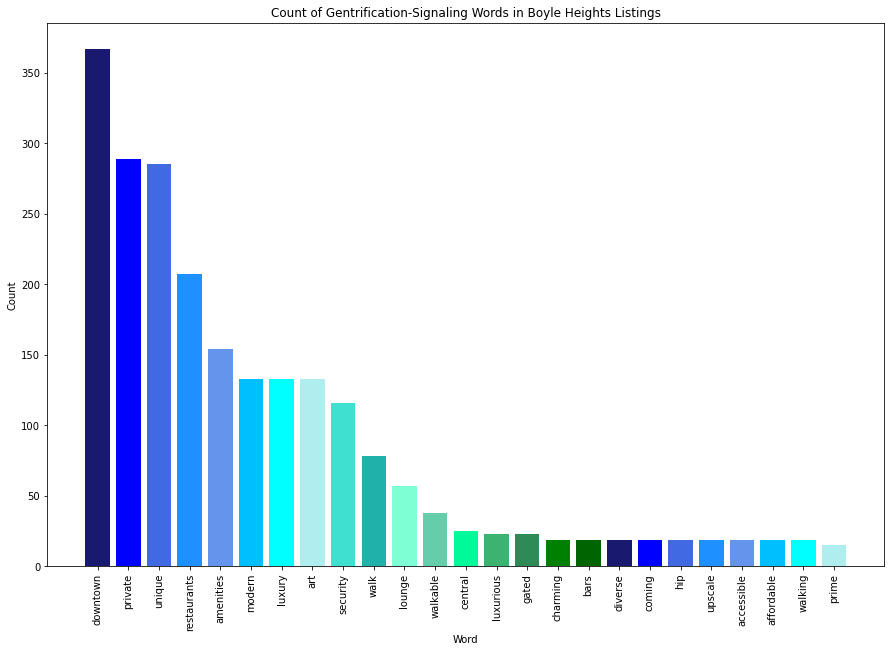

In [63]:
# Boyle Heights  - gentrification code words 
plt.figure(figsize=(15,10))
plt.bar(bohe_g['word'], bohe_g['word_count'], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")

plt.xticks(rotation=90) 

plt.title("Count of Gentrification-Signaling Words in Boyle Heights Listings")
plt.show()




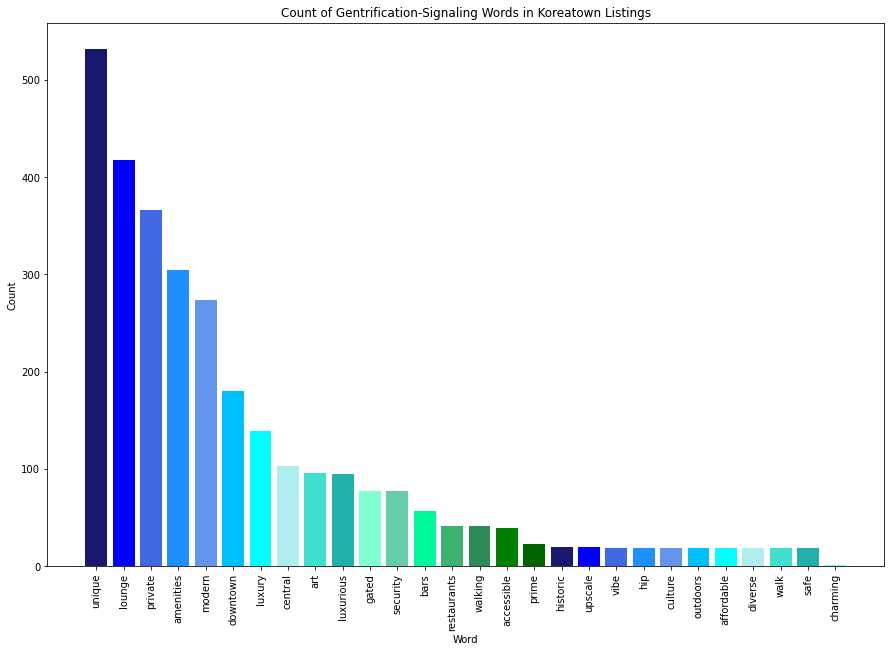

In [64]:
# Koreatown - gentrification code words
plt.figure(figsize=(15,10))
plt.bar(ktown_g['word'], ktown_g['word_count'], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")

plt.xticks(rotation=90) 

plt.title("Count of Gentrification-Signaling Words in Koreatown Listings")
plt.show()



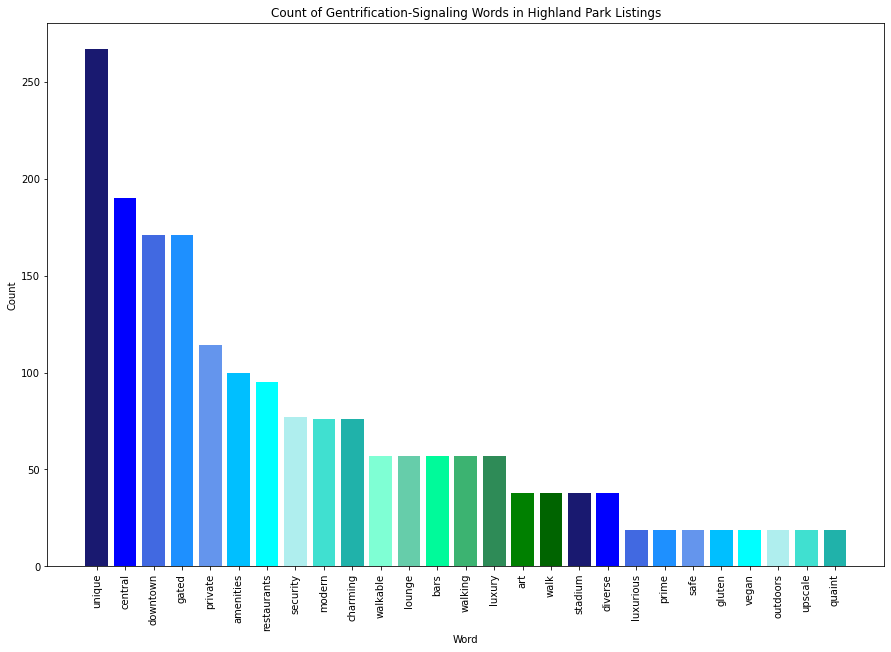

In [65]:
# Highland Park - gentrification code words
plt.figure(figsize=(15,10))
plt.bar(hipa_g['word'], hipa_g['word_count'], color=['midnightblue', 'blue','royalblue','dodgerblue','cornflowerblue','deepskyblue','cyan','paleturquoise', 'turquoise','lightseagreen','aquamarine','mediumaquamarine','mediumspringgreen','mediumseagreen','seagreen','green','darkgreen'])
plt.xlabel("Word")
plt.ylabel("Count")

plt.xticks(rotation=90) 

plt.title("Count of Gentrification-Signaling Words in Highland Park Listings")
plt.show()



Of our hand-curated gentrification code words, **"unique"** is in the top three gentrification codewords for all four neighborhoods. **"private"** ranks in the top three for three out of the four neighborhoods. **"lounge"** and **"Downtown"** shows up in the top three for two out of four neighborhoods, and Highland Park has **"central"** in the top three gentrification code words.

## Gentrification Keyword Analysis 

Next I grouped some of the keywords by theme, mapping listings in different colors based on whether they included a set of keywords. I also defined a function to return the proportion of listings in a neighborhood that includes a keyword.

*I worked on this all of Sunday and Monday, but my notebook crashed and all the code was lost. I didn't re-run these maps and %of listings that included every keyword. I included the code I used for each keyword theme (target renter class, location, neighborhood character, security, transportation) for one neighborhood below.

I had wanted to see if the listings that use certain keywords spatially related; generally there did not seem to be a pattern to where the listings that included certain keywords were located within a neighborhood. However, comparing the proportion of listings that included a certain keyword *across* neighborhoods was quite interesting and informative. 

In [78]:
# function to return proportion of listings that have a keyword  
def return_proportion(df, column, keyword):
    count = 0  
    for i in range(0, len(df), 1):
        if keyword in str(df[column][i]): 
            count += 1
#for each row in the dataframe, if the keyword is in the string of the given column, then up the count of the listings with keyword by 1. 

        else:
            continue
            
    proportion = count/len(df) #divide the count of the keyword by the number of listings. 
    return proportion 

### Target Renter Class 

"luxury", "luxurious", "upscale" 

"affordable", "budget" 

In [18]:
print("Proportion of Listings with DESCRIPTION with keyword 'LUXURY' in EAST HOLLYWOOD: " + str(return_proportion(eho_500, 'Description', 'luxury')))
print("Proportion of Listings with DESCRIPTION with keyword 'LUXURY' in BOYLE HEIGHTS: " + str(return_proportion(bohe_500,'Description', 'luxury')))
print("Proportion of Listings with DESCRIPTION with keyword 'LUXURY' in KOREATOWN: " + str(return_proportion(ktown_500, 'Description','luxury')))
print("Proportion of Listings with DESCRIPTION with keyword 'LUXURY' in HIGHLAND PARK: " + str(return_proportion(hipa_500, 'Description','luxury')))

Proportion of Listings with DESCRIPTION with keyword 'LUXURY' in EAST HOLLYWOOD: 0.19
Proportion of Listings with DESCRIPTION with keyword 'LUXURY' in BOYLE HEIGHTS: 0.11468812877263582
Proportion of Listings with DESCRIPTION with keyword 'LUXURY' in KOREATOWN: 0.134
Proportion of Listings with DESCRIPTION with keyword 'LUXURY' in HIGHLAND PARK: 0.0


Looks like  **19%** of East Hollywood listings has the gentrification code word "LUXURY", compared to **13.4%** of listings in Koreatown and **11.5%** of Boyle Heights. None of the listings in Highland Park include "LUXURY." 


In [150]:
print("Proportion of Listings with DESCRIPTION with keyword 'AFFORDABLE' in EAST HOLLYWOOD: " + str(return_proportion(eho_500, 'Description', 'affordable')))
print("Proportion of Listings with DESCRIPTION with keyword 'AFFORDABLE' in BOYLE HEIGHTS: " + str(return_proportion(bohe_500,'Description', 'affordable')))
print("Proportion of Listings with DESCRIPTION with keyword 'AFFORDABLE' in KOREATOWN: " + str(return_proportion(ktown_500, 'Description','affordable')))
print("Proportion of Listings with DESCRIPTION with keyword 'AFFORDABLE' in HIGHLAND PARK: " + str(return_proportion(hipa_500, 'Description','affordable')))

Proportion of Listings with DESCRIPTION with keyword 'AFFORDABLE' in EAST HOLLYWOOD: 0.788
Proportion of Listings with DESCRIPTION with keyword 'AFFORDABLE' in BOYLE HEIGHTS: 0.0
Proportion of Listings with DESCRIPTION with keyword 'AFFORDABLE' in KOREATOWN: 0.0
Proportion of Listings with DESCRIPTION with keyword 'AFFORDABLE' in HIGHLAND PARK: 0.0


No listing includes the word "affordable" or "budget" in any of the neighborhoods. 

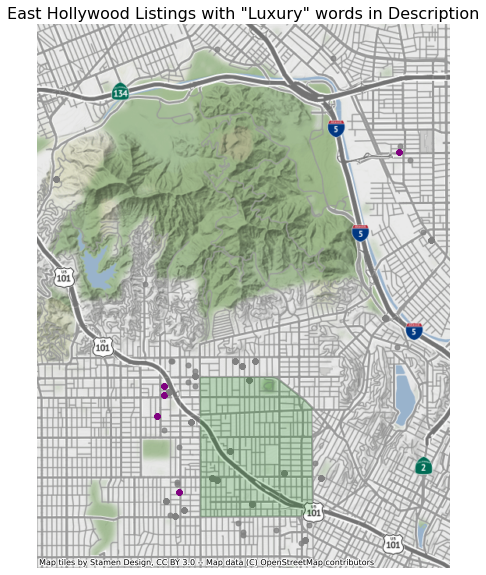

In [103]:
# East Hollywood - luxury vs Affordable  
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(eho_500), 1): 
    listing = gpd.GeoDataFrame(eho_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "luxury" in return_wordlist(listing, "Description") or "luxurious" in return_wordlist(listing, "Description") or "upscale" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "purple") 
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
easthollywood.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('East Hollywood Listings with "Luxury" words in Description',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

Looks like the postings with "luxury"or "luxurious" or "upscale" in or near East Hollywood are west of the 101.

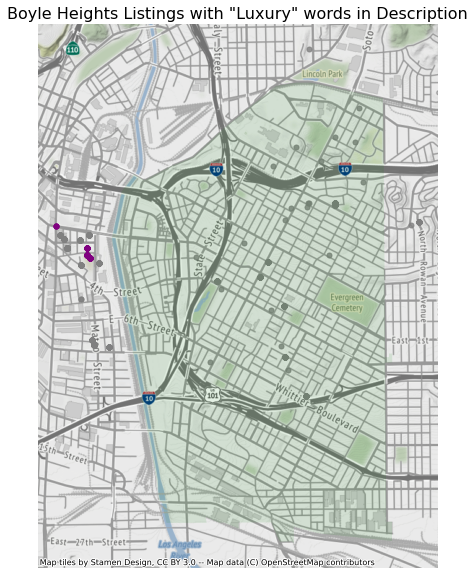

In [104]:
# Boyle Heights - luxury vs Affordable 

# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(bohe_500), 1):
    listing = gpd.GeoDataFrame(bohe_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "luxury" in return_wordlist(listing, "Description") or "luxurious" in return_wordlist(listing, "Description") or "upscale" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "purple") 
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
boyleheights.to_crs('EPSG:3857').plot(ax=ax, alpha=0.1, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Boyle Heights Listings with "Luxury" words in Description',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

The postings with "luxury"or "luxurious" or "upscale" in or near Boyle Heights are west of the LA River.

C:\Users\audre\anaconda3\envs\up229\lib\site-packages\geopandas\plotting.py:604: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\audre\anaconda3\envs\up229\lib\site-packages\geopandas\plotting.py:604: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\audre\anaconda3\envs\up229\lib\site-packages\geopandas\plotting.py:604: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\audre\anaconda3\envs\up229\lib\site-packages\geopandas\plotting.py:604: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\audre\anaconda3\envs\up229\lib\site-packages\geopandas\plotting.py:604: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\audre\anaconda3\envs\up229

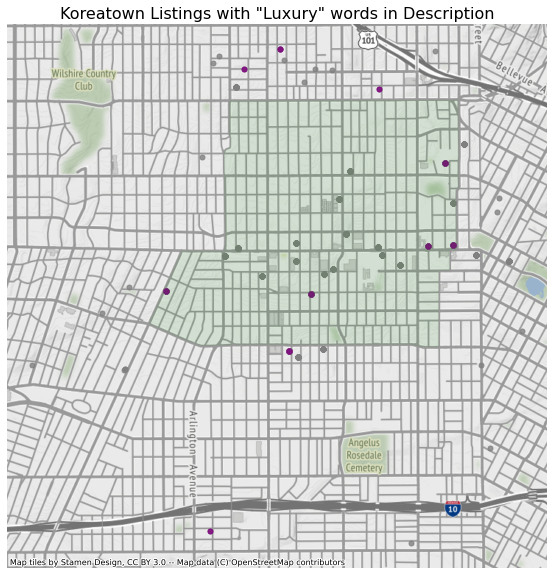

In [96]:
#Koreatown - Luxury vs Affordable
# ADAMS CODE 

# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(ktown_500), 1):
    listing = gpd.GeoDataFrame(ktown_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")
    listing[(listing.Description.str.contains('luxury')) | (listing.Description.str.contains('luxurious'))].to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "purple")

# add neighborhood polygon layer 
koreatown.to_crs('EPSG:3857').plot(ax=ax, alpha=0.1, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Koreatown Listings with "Luxury" words in Description',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

Using Adam's code, I realize that it seems that some of the listings aren't plotting? There isn't really an immediately obvious pattern in the spatial distribution of Koreatown listings that use "luxury" words.

C:\Users\audre\anaconda3\envs\up229\lib\site-packages\geopandas\plotting.py:604: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\audre\anaconda3\envs\up229\lib\site-packages\geopandas\plotting.py:604: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\audre\anaconda3\envs\up229\lib\site-packages\geopandas\plotting.py:604: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\audre\anaconda3\envs\up229\lib\site-packages\geopandas\plotting.py:604: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\audre\anaconda3\envs\up229\lib\site-packages\geopandas\plotting.py:604: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  warnings.warn(
C:\Users\audre\anaconda3\envs\up229

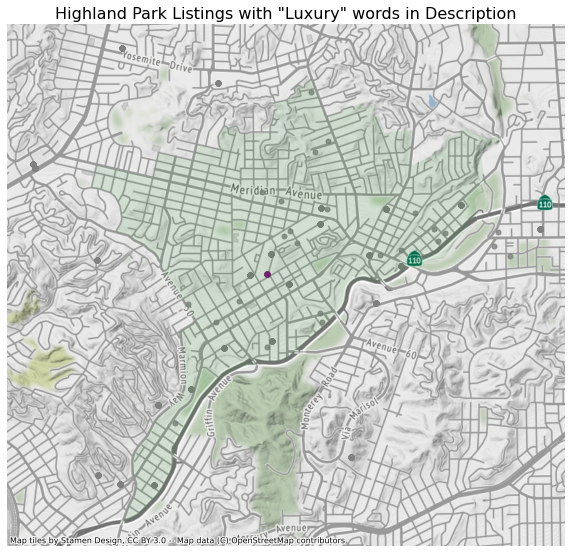

In [108]:
# Highland Park- luxury vs Affordable 
# ADAMS CODE 

# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(hipa_500), 1):
    listing = gpd.GeoDataFrame(hipa_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")
    listing[(listing.Description.str.contains('luxury')) | (listing.Description.str.contains('luxurious'))].to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "purple")

# add neighborhood polygon layer 
highlandpark.to_crs('EPSG:3857').plot(ax=ax, alpha=0.1, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Highland Park Listings with "Luxury" words in Description',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

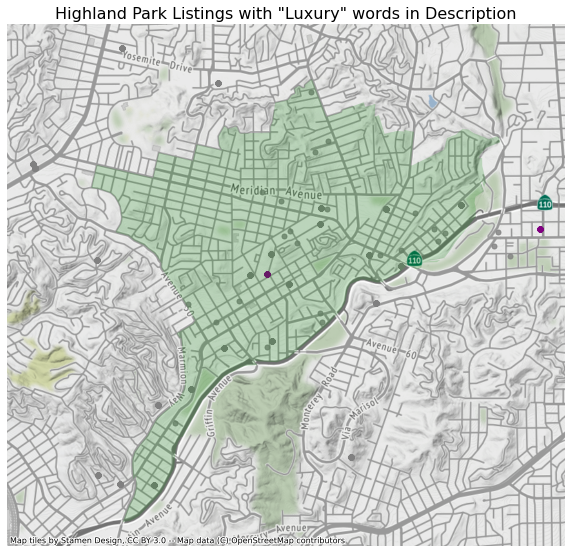

In [109]:
# Highland Park - Luxury vs Affordable 
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(hipa_500), 1):
    listing = gpd.GeoDataFrame(hipa_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "luxury" in return_wordlist(listing, "Description") or "luxurious" in return_wordlist(listing, "Description") or "upscale" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "purple") 
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
highlandpark.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Highland Park Listings with "Luxury" words in Description',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

The postings with "luxury"or "luxurious" or "upscale" in or near Highland Park are scattered around the neighborhood.

### Security Keywords 

"private", "gated", "security", "safe" 

yes or no

In [156]:
print("Proportion of Listings with DESCRIPTION with keyword 'PRIVATE' in EAST HOLLYWOOD: " + str(return_proportion(eho_500, 'Description', 'private')))
print("Proportion of Listings with DESCRIPTION with keyword 'PRIVATE' in BOYLE HEIGHTS: " + str(return_proportion(bohe_500, 'Description', 'private')))
print("Proportion of Listings with DESCRIPTION with keyword 'PRIVATE' in KOREATOWN: " + str(return_proportion(ktown_500, 'Description', 'private')))
print("Proportion of Listings with DESCRIPTION with keyword 'PRIVATE' in HIGHLAND PARK: " + str(return_proportion(hipa_500, 'Description', 'private')))

Proportion of Listings with DESCRIPTION with keyword 'PRIVATE' in EAST HOLLYWOOD: 0.344
Proportion of Listings with DESCRIPTION with keyword 'PRIVATE' in BOYLE HEIGHTS: 0.27565392354124746
Proportion of Listings with DESCRIPTION with keyword 'PRIVATE' in KOREATOWN: 0.192
Proportion of Listings with DESCRIPTION with keyword 'PRIVATE' in HIGHLAND PARK: 0.19


East Hollywood has the highest proportion of listings with 'private' in its description, at 34.4%. 
Boyle Heights has the second highest (27.6%), and Koreatown and Highland Park has roughly the same proportion of listings with the word 'private'. 

<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.S

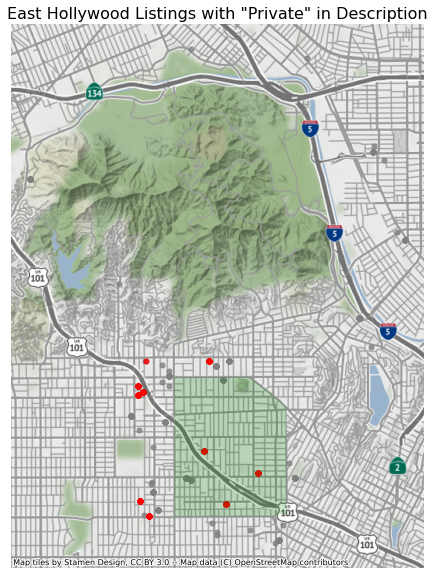

In [159]:
## East Hollywood - 'Private'
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(eho_500), 1):
    listing = gpd.GeoDataFrame(eho_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "private" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "red")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
easthollywood.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('East Hollywood Listings with "Private" in Description',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

I don't know why it's printing <class > so many times but it maps at the end! 
    
There doesn't seem to be strong pattern to where the listings that use the word "private" in or near East Hollywood are located.

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

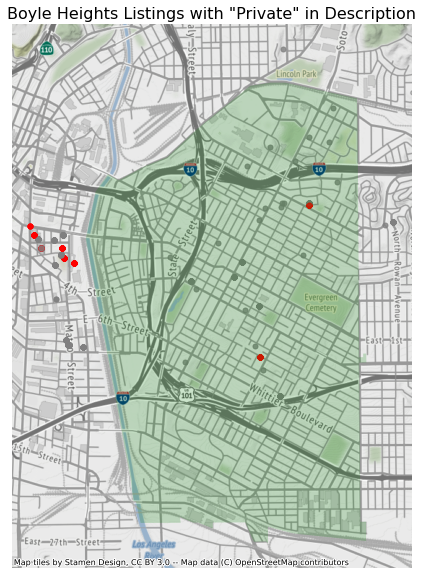

In [24]:
## Boyle Heights - 'Private' 
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(bohe_500), 1):
    print(i) 
    listing = gpd.GeoDataFrame(bohe_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "private" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "red")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
boyleheights.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Boyle Heights Listings with "Private" in Description',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

There seems to be a cluster of listings that use "private" in the description on the west side of the River. That's where the arts district is.

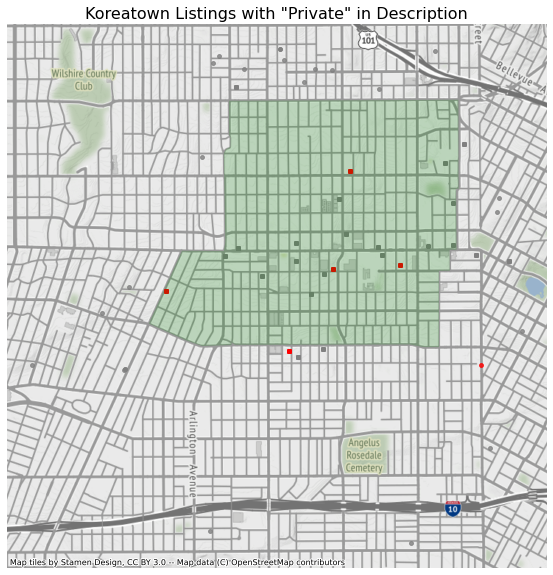

In [25]:
## Koreatown - 'Private'
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(ktown_500), 1):
    listing = gpd.GeoDataFrame(ktown_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "private" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=15, color = "red")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=15, color = "gray")

# add neighborhood polygon layer 
koreatown.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Koreatown Listings with "Private" in Description',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

Listings that use "private" in Koreatown are pretty scattered. 

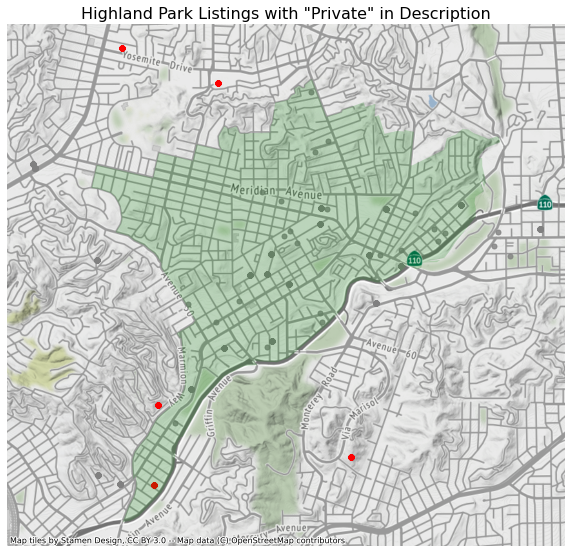

In [26]:
## Highland Park - 'Private'
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(hipa_500), 1):
    listing = gpd.GeoDataFrame(hipa_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "private" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "red")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
highlandpark.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Highland Park Listings with "Private" in Description',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

There aren't many listings that use "private" in Highland Park proper. 

### Transit 

"parking" 

"transit" 

In [18]:
print("Proportion of Listings with DESCRIPTION with keyword 'PARKING' in EAST HOLLYWOOD: " + str(return_proportion(eho_500, 'Description', 'parking')))
print("Proportion of Listings with DESCRIPTION with keyword 'PARKING' in BOYLE HEIGHTS: " + str(return_proportion(bohe_500, 'Description','parking')))
print("Proportion of Listings with DESCRIPTION with keyword 'PARKING' in KOREATOWN: " + str(return_proportion(ktown_500, 'Description','parking')))
print("Proportion of Listings with DESCRIPTION with keyword 'PARKING' in HIGHLAND PARK: " + str(return_proportion(hipa_500,'Description', 'parking')))

Proportion of Listings with DESCRIPTION with keyword 'PARKING' in EAST HOLLYWOOD: 0.328
Proportion of Listings with DESCRIPTION with keyword 'PARKING' in BOYLE HEIGHTS: 0.3561368209255533
Proportion of Listings with DESCRIPTION with keyword 'PARKING' in KOREATOWN: 0.204
Proportion of Listings with DESCRIPTION with keyword 'PARKING' in HIGHLAND PARK: 0.532


In [19]:
print("Proportion of Listings with DESCRIPTION with keyword 'TRANSIT' in EAST HOLLYWOOD: " + str(return_proportion(eho_500,'Description', 'transit')))
print("Proportion of Listings with DESCRIPTION with keyword 'TRANSIT' in BOYLE HEIGHTS: " + str(return_proportion(bohe_500,'Description', 'transit')))
print("Proportion of Listings with DESCRIPTION with keyword 'TRANSIT' in KOREATOWN: " + str(return_proportion(ktown_500,'Description', 'transit')))
print("Proportion of Listings with DESCRIPTION with keyword 'TRANSIT' in HIGHLAND PARK: " + str(return_proportion(hipa_500,'Description', 'transit')))

Proportion of Listings with DESCRIPTION with keyword 'TRANSIT' in EAST HOLLYWOOD: 0.038
Proportion of Listings with DESCRIPTION with keyword 'TRANSIT' in BOYLE HEIGHTS: 0.07645875251509054
Proportion of Listings with DESCRIPTION with keyword 'TRANSIT' in KOREATOWN: 0.038
Proportion of Listings with DESCRIPTION with keyword 'TRANSIT' in HIGHLAND PARK: 0.0


* 32.8% of listings in East Hollywood include the word "parking" 
* 3.8% of listings in East Hollywood include the word "transit" 


* 35.6% of listings in Boyle Heights include the word "parking" 
* 7.6% of listings in Boyle Heights include the word "transit" 


* 20.4% of listings in Koreatown include the word "parking" 
* 3.8% of listings in Koreatown include the word "transit" 


* 53.2% of listings in Highland Park include the word "parking"
* 0% of listings in Highland Park include the word "transit"

This was super fascinating to me. I'm surprised given Koreatown's transit-orientedness how few listings include the word "transit". I'm not surprised that Highland Park has the highest percentage of listings with the word "parking", and 0 listings that include the word "transit"-- as an Angeleno without a car, I don't find myself in that area of town very often. 



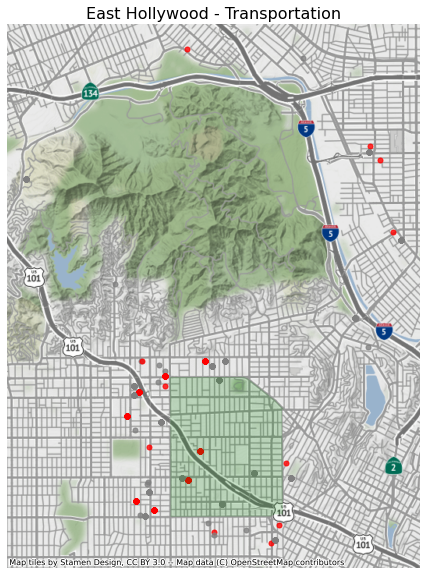

In [97]:
## East Hollywood - transportation  
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(eho_500), 1):
    listing = gpd.GeoDataFrame(eho_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "parking" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "red")
    elif "transit"  in return_wordlist(listing, "Description"):
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "blue")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
easthollywood.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('East Hollywood - Transportation' ,fontsize=16)

# add a basemap
ctx.add_basemap(ax)

No pattern to be seen for East Hollywood listings that indicate "parking" in description.

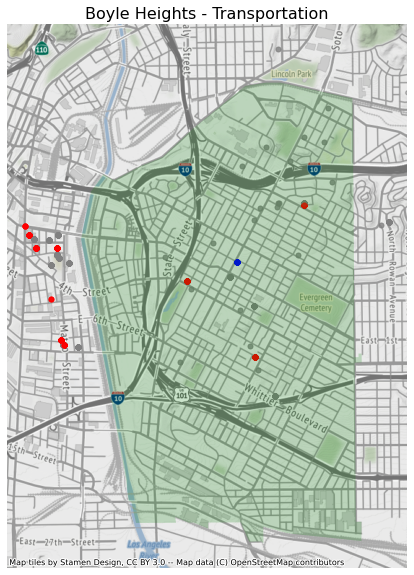

In [98]:
## Boyle Heights
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(bohe_500), 1):
    listing = gpd.GeoDataFrame(bohe_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "parking" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "red")
    elif "transit"  in return_wordlist(listing, "Description"):
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "blue")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
boyleheights.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Boyle Heights - Transportation' ,fontsize=16)

# add a basemap
ctx.add_basemap(ax)

There's one blue listing in the center of Boyle Heights that indicates "transit" in its description. 

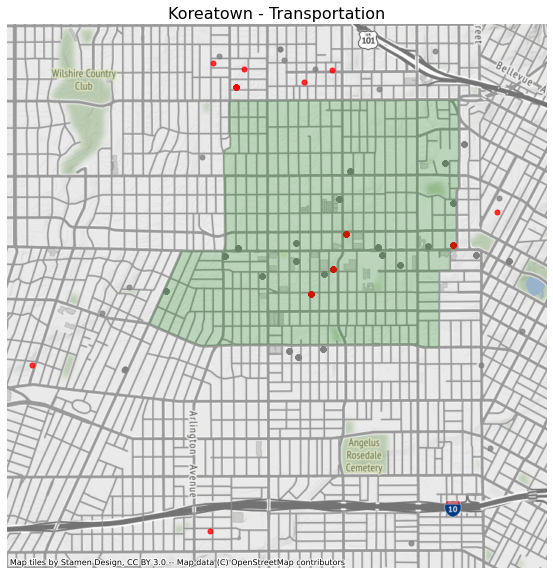

In [99]:
## Koreatown
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(ktown_500), 1):
    listing = gpd.GeoDataFrame(ktown_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "parking" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "red")
    elif "transit"  in return_wordlist(listing, "Description"):
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "blue")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
koreatown.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Koreatown - Transportation' ,fontsize=16)

# add a basemap
ctx.add_basemap(ax)

No pattern to be seen for Koreatown listings that indicate "parking" in description.

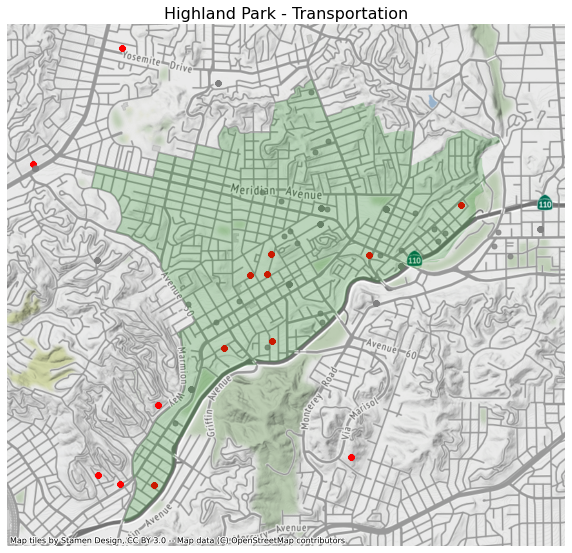

In [100]:
## Highland Park
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(hipa_500), 1):
    listing = gpd.GeoDataFrame(hipa_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "parking" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "red")
    elif "transit"  in return_wordlist(listing, "Description"):
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "blue")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
highlandpark.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Highland Park - Transportation' ,fontsize=16)

# add a basemap
ctx.add_basemap(ax)

No pattern to be seen for Highland Park listings that indicate "parking" in description.

### Neighborhood Character 

"unique", "authentic", "diverse", "charming", "culture", "quirky" 

"hip", "modern", "renovated"  

In [21]:
# "unique"
print("Proportion of Listings with DESCRIPTION with keyword 'UNIQUE' in EAST HOLLYWOOD: " + str(return_proportion(eho_500,'Description', 'unique')))
print("Proportion of Listings with DESCRIPTION with keyword 'UNIQUE' in BOYLE HEIGHTS: " + str(return_proportion(bohe_500, 'Description','unique')))
print("Proportion of Listings with DESCRIPTION with keyword 'UNIQUE' in KOREATOWN: " + str(return_proportion(ktown_500, 'Description','unique')))
print("Proportion of Listings with DESCRIPTION with keyword 'UNIQUE' in HIGHLAND PARK: " + str(return_proportion(hipa_500,'Description', 'unique')))

Proportion of Listings with DESCRIPTION with keyword 'UNIQUE' in EAST HOLLYWOOD: 0.686
Proportion of Listings with DESCRIPTION with keyword 'UNIQUE' in BOYLE HEIGHTS: 0.45875251509054327
Proportion of Listings with DESCRIPTION with keyword 'UNIQUE' in KOREATOWN: 0.954
Proportion of Listings with DESCRIPTION with keyword 'UNIQUE' in HIGHLAND PARK: 0.42


*95%* of listings in Koreatown use the word "unique"??? 

In [22]:
# "authentic" 
print("Proportion of Listings with DESCRIPTION with keyword 'AUTHENTIC' in EAST HOLLYWOOD: " + str(return_proportion(eho_500,'Description', 'authentic')))
print("Proportion of Listings with DESCRIPTION with keyword 'AUTHENTIC' in BOYLE HEIGHTS: " + str(return_proportion(bohe_500, 'Description','authentic')))
print("Proportion of Listings with DESCRIPTION with keyword 'AUTHENTIC' in KOREATOWN: " + str(return_proportion(ktown_500, 'Description','authentic')))
print("Proportion of Listings with DESCRIPTION with keyword 'AUTHENTIC' in HIGHLAND PARK: " + str(return_proportion(hipa_500,'Description', 'authentic')))

Proportion of Listings with DESCRIPTION with keyword 'AUTHENTIC' in EAST HOLLYWOOD: 0.076
Proportion of Listings with DESCRIPTION with keyword 'AUTHENTIC' in BOYLE HEIGHTS: 0.0
Proportion of Listings with DESCRIPTION with keyword 'AUTHENTIC' in KOREATOWN: 0.038
Proportion of Listings with DESCRIPTION with keyword 'AUTHENTIC' in HIGHLAND PARK: 0.0


7.6% of East Hollywood listings and 3.8% of Koreatown listings use the word "authentic", which is honestly lower than I thought. 

I guess there's nothing "authentic" about Highland Park or Boyle Heights. (jokes) 

In [23]:
# "diverse" 
print("Proportion of Listings with DESCRIPTION with keyword 'DIVERSE' in EAST HOLLYWOOD: " + str(return_proportion(eho_500,'Description', 'diverse')))
print("Proportion of Listings with DESCRIPTION with keyword 'DIVERSE' in BOYLE HEIGHTS: " + str(return_proportion(bohe_500, 'Description','diverse')))
print("Proportion of Listings with DESCRIPTION with keyword 'DIVERSE' in KOREATOWN: " + str(return_proportion(ktown_500, 'Description','diverse')))
print("Proportion of Listings with DESCRIPTION with keyword 'DIVERSE' in HIGHLAND PARK: " + str(return_proportion(hipa_500,'Description', 'diverse')))

Proportion of Listings with DESCRIPTION with keyword 'DIVERSE' in EAST HOLLYWOOD: 0.038
Proportion of Listings with DESCRIPTION with keyword 'DIVERSE' in BOYLE HEIGHTS: 0.03822937625754527
Proportion of Listings with DESCRIPTION with keyword 'DIVERSE' in KOREATOWN: 0.0
Proportion of Listings with DESCRIPTION with keyword 'DIVERSE' in HIGHLAND PARK: 0.076


Hmm, Highland Park has the highest proportion of listings with the word "diverse" in their descriptions. 3.8% for both East Hollywood and Boyle Heights which seems low - maybe landlords aren't trying to emphasize the diverse nature of these neighborhoods? And absolutely ridiculous that Koreatown has 0 listings that use that term, given it is one of the most diverse neighborhoods in the country. 

In [30]:
print("Proportion of Listings with DESCRIPTION with keyword 'MODERN' in EAST HOLLYWOOD: " + str(return_proportion(eho_500,'Description', 'modern')))
print("Proportion of Listings with DESCRIPTION with keyword 'HIP' in EAST HOLLYWOOD: " + str(return_proportion(eho_500,'Description', 'hip')))
print("Proportion of Listings with DESCRIPTION with keyword 'RENOVATED' in EAST HOLLYWOOD: " + str(return_proportion(eho_500,'Description', 'renovated')))


Proportion of Listings with DESCRIPTION with keyword 'MODERN' in EAST HOLLYWOOD: 0.156
Proportion of Listings with DESCRIPTION with keyword 'HIP' in EAST HOLLYWOOD: 0.076
Proportion of Listings with DESCRIPTION with keyword 'RENOVATED' in EAST HOLLYWOOD: 0.082


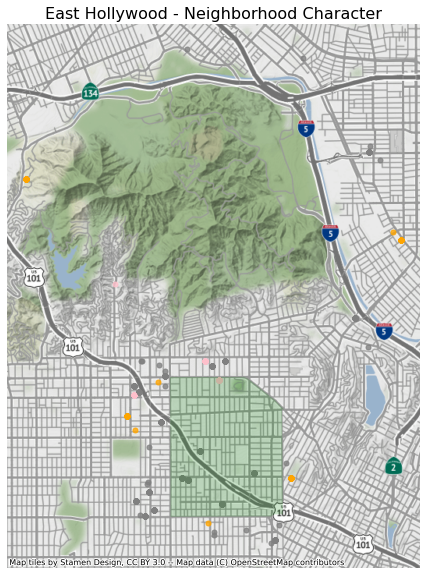

In [31]:
# East Hollywood - Neighborhood Character 
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(eho_500), 1):
    listing = gpd.GeoDataFrame(eho_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "unique" in return_wordlist(listing, "Description") or "authentic" in return_wordlist(listing, "Description") or "diverse" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "pink")
    elif "hip"  in return_wordlist(listing, "Description") or "modern" in return_wordlist(listing, "Description") or "renovated" in return_wordlist(listing, "Description"):
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "orange")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
easthollywood.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('East Hollywood - Neighborhood Character',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

It seems that the "unique"/"authentic"/"diverse" listings are around the periphery of East Hollywood, and the "hip"/"modern"/"renovated" listings are northwest of East Hollywood, at the border with West Hollywood. 

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

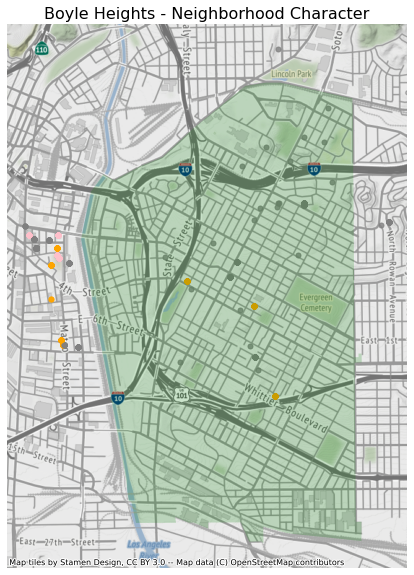

In [79]:
## Boyle Heights - Neighborhood Character 
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(bohe_500), 1):
    print(i)
    listing = gpd.GeoDataFrame(bohe_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "unique" in return_wordlist(listing, "Description") or "authentic" in return_wordlist(listing, "Description") or "diverse" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "pink")
    elif "hip"  in return_wordlist(listing, "Description") or "modern" in return_wordlist(listing, "Description") or "renovated" in return_wordlist(listing, "Description"):
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "orange")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
boyleheights.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Boyle Heights - Neighborhood Character',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

The "unique"/"authentic"/"diverse" listings are in the Arts District and in the center of Boyle Heights, and the "hip"/"modern"/"renovated" listings are all west of the river in the Arts District. 

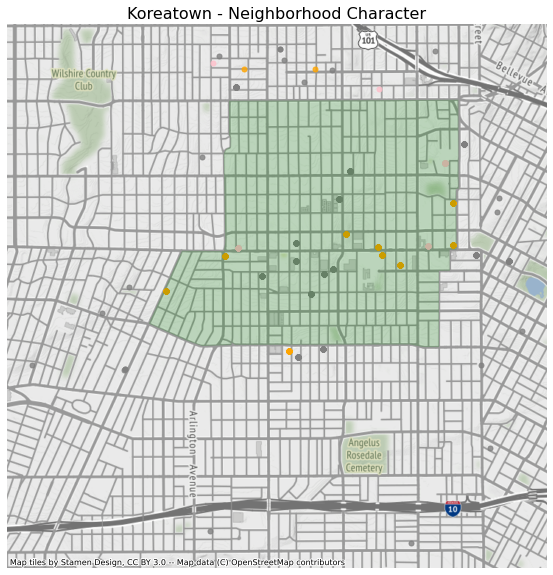

In [80]:
## Koreatown- Neighborhood Character 
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(ktown_500), 1):
    listing = gpd.GeoDataFrame(ktown_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "unique" in return_wordlist(listing, "Description") or "authentic" in return_wordlist(listing, "Description") or "diverse" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "pink")
    elif "hip"  in return_wordlist(listing, "Description") or "modern" in return_wordlist(listing, "Description") or "renovated" in return_wordlist(listing, "Description"):
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "orange")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
koreatown.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Koreatown - Neighborhood Character',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

For Koreatown, both groups of "unique"/"authentic"/"diverse" listings and the "hip"/"modern"/"renovated" listings are scattered around and north of the neighborhood. 

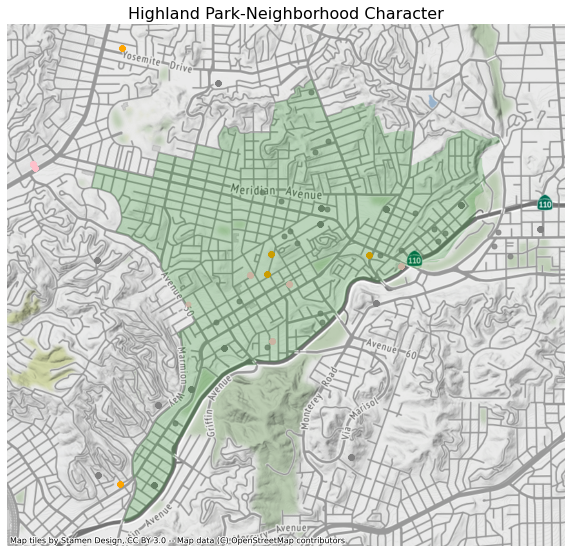

In [102]:
## Highland Park - Neighborhood Character 
fig, ax = plt.subplots(figsize=(10, 10))

for i in range(0, len(hipa_500), 1):
    listing = gpd.GeoDataFrame(hipa_500.iloc[i])
    listing = listing.transpose()
    listing = listing.set_crs("EPSG:4326")
    
    if "unique" in return_wordlist(listing, "Description") or "authentic" in return_wordlist(listing, "Description") or "diverse" in return_wordlist(listing, "Description"):
        # add the layer with ax=ax in the argument 
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "pink")
    elif "hip"  in return_wordlist(listing, "Description") or "modern" in return_wordlist(listing, "Description") or "renovated" in return_wordlist(listing, "Description"):
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "orange")
    else:
        listing.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8, markersize=25, color = "gray")

# add neighborhood polygon layer 
highlandpark.to_crs('EPSG:3857').plot(ax=ax, alpha=0.2, color = "green")

# turn the axis off
ax.axis('off')

# set a title
ax.set_title('Highland Park-Neighborhood Character',fontsize=16)

# add a basemap
ctx.add_basemap(ax)

For Highland Park, there doesn't seem to be much of a spatial pattern distribution in either "unique"/"authentic"/"diverse" listings nor the "hip"/"modern"/"renovated" listings.

## NEXT: Rents Analysis  

I also scraped the lat/long location and "Pricing & Floor Plans" sections that provides available unit type and rents. In the next notebook, I will dive deeper into the relationship between neighborhood rents and their gentrification word frequencies. I will be exploding each listing into multiple rows. Hopefully I can get to a scatterplot of median rents / rents per SF / rents per BR X frequency of gentrification keywords. 
